## CS 445: Computational Photography

## Programming Project #3: Gradient Domain Fusion

In [3]:
from google.colab import drive
drive.mount('/content/drive')

ModuleNotFoundError: No module named 'google'

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import os
from random import random
import time
import scipy
import scipy.sparse.linalg

# modify to where you store your project data including utils.py
datadir = "/content/drive/My Drive/cs445_projects/proj3/" 

utilfn = datadir + "utils.py"
# !cp "$utilfn" .
samplesfn = datadir + "samples"
# !cp -r "$samplesfn" .
import utils
from utils import *

In [3]:
# MY HELPERS
from random import randint
def showImg(img):
    if isinstance(img, list):
        fig, axes = plt.subplots(1, len(img))
        for i in range(len(img)):
            axes[i].imshow(img[i], cmap='gray')
            axes[i].set_title('Image ' + str(i)), axes[i].set_xticks([]), axes[i].set_yticks([])
        return axes
    
    else:
        fig = plt.figure()
        plt.imshow(img, cmap='gray')
        plt.axis('off')

def label(axes, labels):
    for i in range(len(labels)):
        axes[i].set_title(labels[i])

## Part 1 Toy Problem (20 pts)

In [6]:
def toy_reconstruct(img):
    """
    The implementation for gradient domain processing is not complicated, but it is easy to make a mistake, so let's start with a toy example. Reconstruct this image from its gradient values, plus one pixel intensity. Denote the intensity of the source image at (x, y) as s(x,y) and the value to solve for as v(x,y). For each pixel, then, we have two objectives:
    1. minimize (v(x+1,y)-v(x,y) - (s(x+1,y)-s(x,y)))^2
    2. minimize (v(x,y+1)-v(x,y) - (s(x,y+1)-s(x,y)))^2
    Note that these could be solved while adding any constant value to v, so we will add one more objective:
    3. minimize (v(1,1)-s(1,1))^2
    
    :param toy_img: numpy.ndarray
    """
    im_h, im_w = img.shape # get img shape
    imgIdx = np.arange(im_h * im_w).reshape(im_h, im_w) # make array of increasing numbers to map 1 dimentional index
    varLen = im_h * im_w # calc number of variables
    
    A = []
    b = []
    for y in range(im_h - 1):
        for x in range(im_w - 1):
            if y == x == 1: # equation 2
                coef = np.zeros([varLen])
                coef[imgIdx[1, 1]] = 1
                A.append(coef)
                b.append(img[1,1])

            # equation 1
            coef = np.zeros([varLen]) # array for coeffitions to be appended to A
            coef[imgIdx[y, x+1]] = 1 # set coefficient values
            coef[imgIdx[y, x]] = -1
            A.append(coef) # append to A
            b.append(img[y, x+1] - img[y, x]) # append const to b
            
            # equation 2
            coef = np.zeros([varLen])
            coef[imgIdx[y+1, x]] = 1
            coef[imgIdx[y, x]] = -1
            A.append(coef)
            b.append(img[y+1, x] - img[y, x])         
            
    
    # solve
    A = scipy.sparse.lil_matrix(A)
    v = scipy.sparse.linalg.lsqr(A.tocsr(), b)[0] 
    v = np.array(v)
    return v.reshape(img.shape)

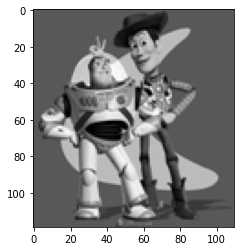

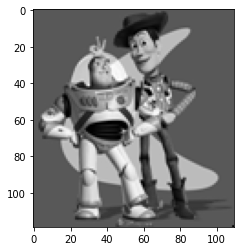

Max error is:  0.34509803921568627


In [7]:
toy_img = cv2.cvtColor(cv2.imread('samples/toy_problem.png'), cv2.COLOR_BGR2GRAY).astype('double') / 255.0
plt.imshow(toy_img, cmap="gray")
plt.show()

im_out = toy_reconstruct(toy_img)
plt.imshow(im_out, cmap="gray")
plt.show()
print("Max error is: ", np.sqrt(((im_out - toy_img)**2).max()))

## Preparation

<IPython.core.display.Javascript object>


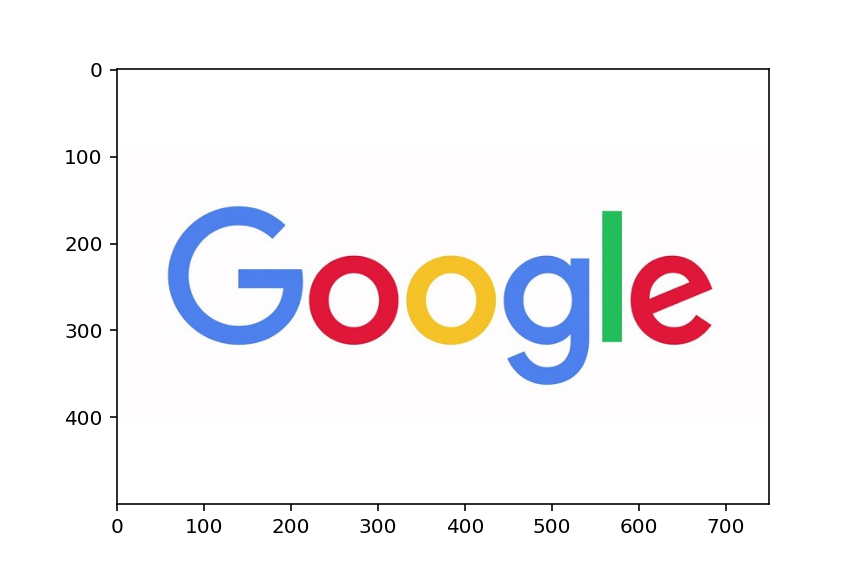

<IPython.core.display.Javascript object>


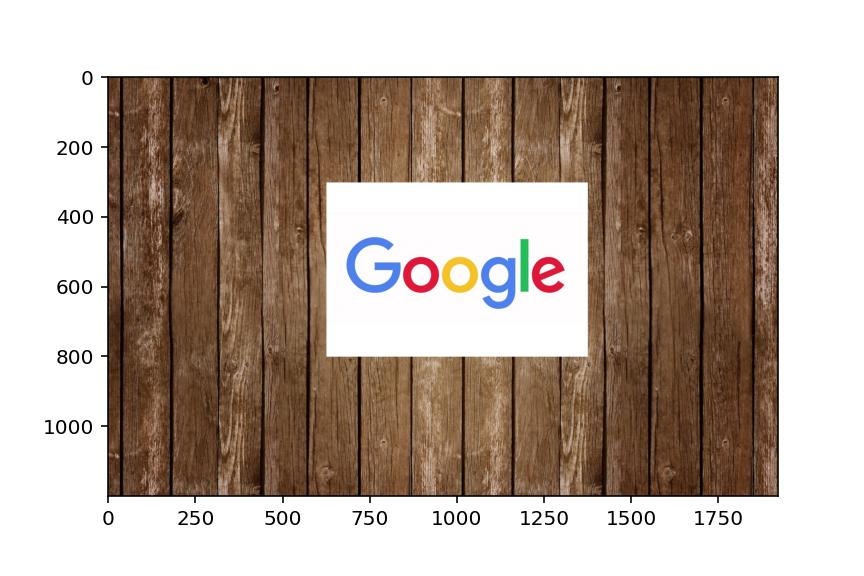

In [95]:
background_img = cv2.cvtColor(cv2.imread('samples/wood.JPG'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.figure()
plt.imshow(background_img)
plt.show()
object_img = cv2.cvtColor(cv2.imread('samples/google.JPG'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.imshow(object_img)
plt.show()

use_interface = False  # set to true if you want to use the interface to choose points (might not work in Colab)
if not use_interface:
  xs = (1, 1, 749, 749)
  ys = (1, 499, 499, 1)
  object_mask = utils.get_mask(ys, xs, object_img)
  bottom_center = (1000, 800) # (x,y)

  object_img, object_mask = utils.crop_object_img(object_img, object_mask)
  bg_ul = utils.upper_left_background_rc(object_mask, bottom_center)
  plt.imshow(utils.get_combined_img(background_img, object_img, object_mask, bg_ul))



In [47]:
print(mask_coords[0])
print(mask_coords[1])

[23.069001793598204, None, 11.571577216703417, 48.363335862766746, 181.73346095474608, 356.4943145235467, 466.8695904617365, 494.463409446284, 393.28607316960995, None, 209.3272799392936]
[38.52513337012522, None, 233.98135117733636, 390.34632542310527, 473.12778237674763, 473.12778237674763, 374.2499310154526, 153.49937913907291, 10.931314385577707, None, 6.33234455481977]


If it doesn't get you to the drawing mode, then rerun this function again.


<IPython.core.display.Javascript object>


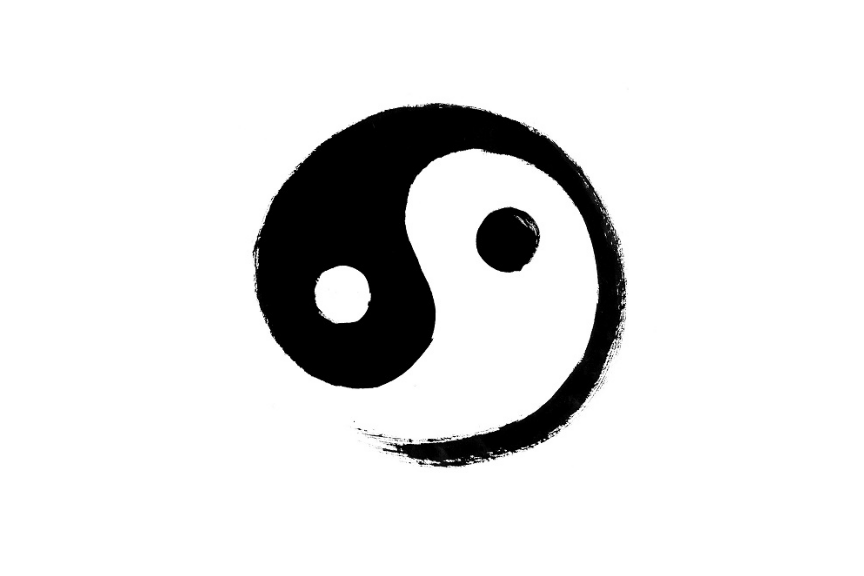

In [50]:
if use_interface:
  import matplotlib.pyplot as plt
  %matplotlib notebook
  mask_coords = specify_mask(object_img)

In [25]:
if use_interface:
  xs = mask_coords[0]
  ys = mask_coords[1]
  %matplotlib inline
  import matplotlib.pyplot as plt
  plt.figure()
  object_mask = get_mask(ys, xs, object_img)

TypeError: '>=' not supported between instances of 'float' and 'NoneType'

<Figure size 432x288 with 0 Axes>

If it doesn't get you to the drawing mode, then rerun this function again. Also, make sure the object fill fit into the background image. Otherwise it will crash


<IPython.core.display.Javascript object>


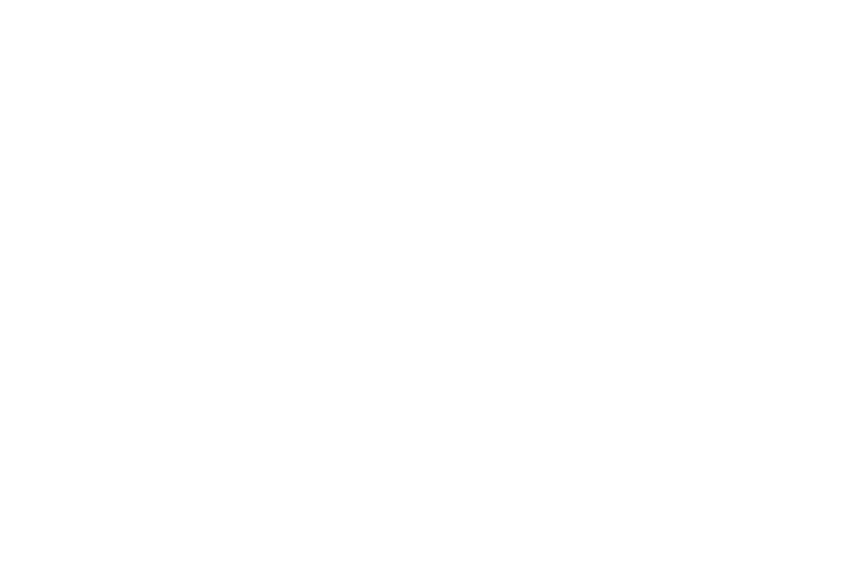

ValueError: operands could not be broadcast together with shapes (0,0) (286,366) 

In [156]:
if use_interface:
  %matplotlib notebook
  import matplotlib.pyplot as plt
  bottom_center = specify_bottom_center(background_img)
  %matplotlib inline
  import matplotlib.pyplot as plt

  object_img, object_mask = utils.crop_object_img(object_img, object_mask)
  bg_ul = utils.upper_left_background_rc(object_mask, bottom_center)
  plt.imshow(utils.get_combined_img(background_img, object_img, object_mask, bg_ul))



## Part 2 Poisson Blending (50 pts)

In [8]:
def neighbors(y,x):
    near = []
#     if x == 0:
#         near.append((y, x-1))
#     if y == 0:
#         near.append((y-1, x))
    near.append((y, x+1))
    near.append((y+1, x))
    near.append((y, x-1))
    near.append((y-1, x))
    return near
        
def poisson_blend(object_img, object_mask, bg_img, bg_ul):
    """
    Returns a Poisson blended image with masked object_img over the bg_img at position specified by bg_ul.
    Can be implemented to operate on a single channel or multiple channels
    :param object_img: the image containing the foreground object
    :param object_mask: the mask of the foreground object in object_img
    :param background_img: the background image 
    :param bg_ul: position (row, col) in background image corresponding to (0,0) of object_img 
    """
    #TO DO   
    nnz = (object_mask>0).sum()
#     im2var = -np.ones(object_img.shape[0:2], dtype='int32')
#     im2var[object_mask>0] = np.arange(nnz)
    

    im_h, im_w = object_img.shape # get img shape
    im2var = np.arange(im_h * im_w).reshape(im_h, im_w)

    yOrg, xOrg = bg_ul
    
    m = 4 * im_h * im_w
    n = im_h * im_w

    A = scipy.sparse.lil_matrix((m, n))
    b = np.zeros(m)
    
    e = 0
    
    for y in range(im_h):
        for x in range(im_w):
            if object_mask[y,x] > 0:
                for neighbor in neighbors(y,x):
                    if 0 <= neighbor[0] < im_h and 0 <= neighbor[1] < im_w:
                        A[e, im2var[y,x]] = 1 # set coefficient values
                        if object_mask[neighbor] == 0:
                            b[e] = object_img[y,x] - object_img[neighbor] + bg_img[yOrg+neighbor[0], xOrg+neighbor[1]]
                        else:
                            A[e, im2var[neighbor]] = -1
                            b[e] = object_img[y,x] - object_img[neighbor]
                    e += 1
    A = scipy.sparse.csr_matrix(A)
    v = scipy.sparse.linalg.lsqr(A, b)[0]
#     v = np.interp(v, (v.min(), v.max()), (0, +1))
#     v = np.array(v)
#     for y in range(im_h):
#         for x in range(im_w):
#             if im2var[y,x] >= 0:
#                 im2var[y,x] = v[0]
#                 v = np.delete(v, 0)
        
    target = bg_img.copy()
#     targetImg[xOrg:xOrg+im2var.shape[0], yOrg:yOrg+im2var.shape[1]] = im2var
    target[yOrg:yOrg+im_h, xOrg:xOrg+im_w][object_mask>0] = 0
    target[yOrg:yOrg+im_h, xOrg:xOrg+im_w] += v.reshape(object_img.shape)
    return target
                
    

<IPython.core.display.Javascript object>


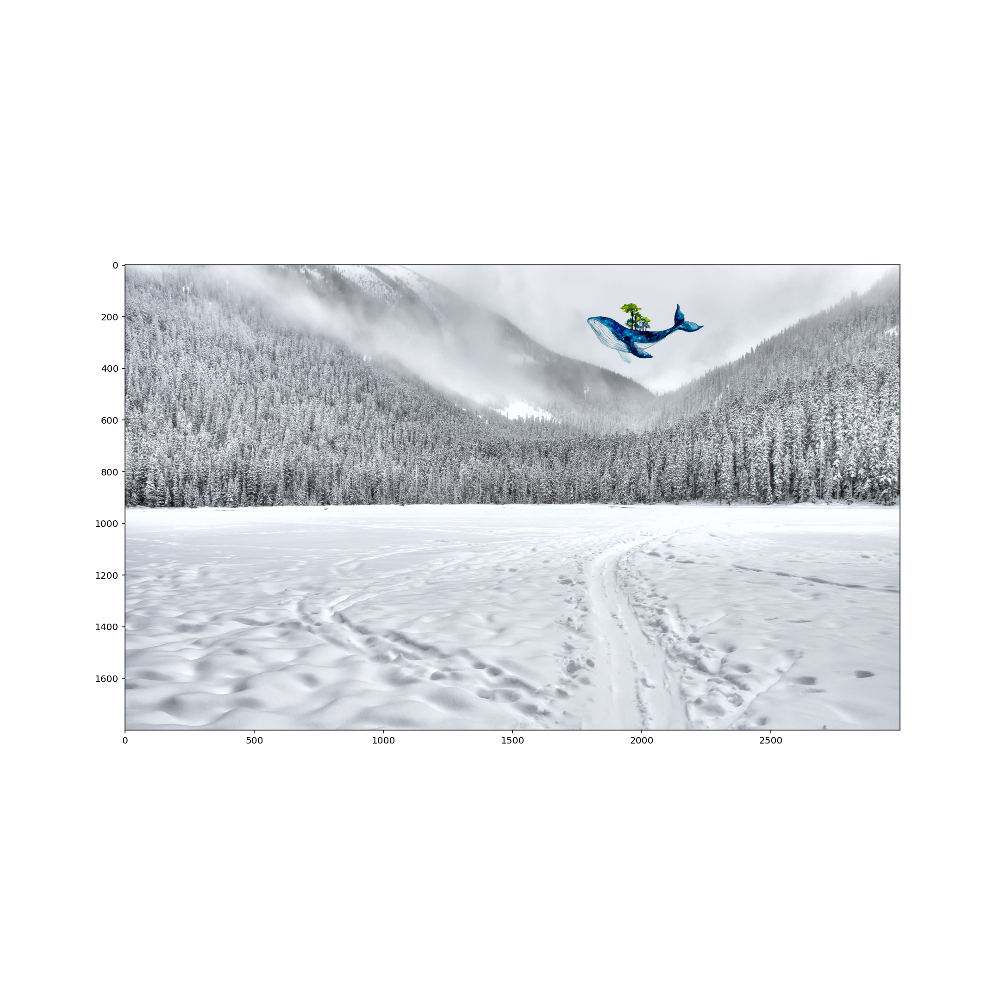

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


In [42]:
im_blend = np.zeros(background_img.shape)
for b in np.arange(3):
  im_blend[:,:,b] = poisson_blend(object_img[:,:,b], object_mask, background_img[:,:,b].copy(), bg_ul)

plt.figure(figsize=(15,15))
plt.imshow(im_blend)

## Part 3 Mixed Gradients (20 pts)

In [68]:
def mixed_blend(object_img, object_mask, bg_img, bg_ul):
    """
    Returns a mixed gradient blended image with masked object_img over the bg_img at position specified by bg_ul.
    Can be implemented to operate on a single channel or multiple channels
    :param object_img: the image containing the foreground object
    :param object_mask: the mask of the foreground object in object_img
    :param background_img: the background image 
    :param bg_ul: position (row, col) in background image corresponding to (0,0) of object_img 
    """
    #TO DO 
    nnz = (object_mask>0).sum() 

    im_h, im_w = object_img.shape # get img shape
    im2var = np.arange(im_h * im_w).reshape(im_h, im_w)

    yOrg, xOrg = bg_ul
    
    m = 4 * im_h * im_w
    n = im_h * im_w

    A = scipy.sparse.lil_matrix((m, n))
    b = np.zeros(m)
    
    e = 0
    
    for y in range(im_h):
        for x in range(im_w):
            if object_mask[y,x] > 0:
                for neighbor in neighbors(y,x):
                    if 0 <= neighbor[0] < im_h and 0 <= neighbor[1] < im_w:
                        A[e, im2var[y,x]] = 1 # set coefficient values
                        
                        objGrad = object_img[y,x] - object_img[neighbor]
                        tarGrad = bg_img[yOrg+y, xOrg+x] - bg_img[yOrg+neighbor[0], xOrg+neighbor[1]]
                        grads = np.array([objGrad, tarGrad])
                        maxGradIdx = np.argmax(np.abs(grads))
                        maxGrad = grads[maxGradIdx]
                                         
                        if object_mask[neighbor] == 0:
                            b[e] = maxGrad + bg_img[yOrg+neighbor[0], xOrg+neighbor[1]]
                        else:
                            A[e, im2var[neighbor]] = -1
                            b[e] = maxGrad
                    e += 1
    A = scipy.sparse.csr_matrix(A)
    v = scipy.sparse.linalg.lsqr(A, b)[0]
        
    target = bg_img.copy()
    target[yOrg:yOrg+im_h, xOrg:xOrg+im_w][object_mask>0] = 0
    target[yOrg:yOrg+im_h, xOrg:xOrg+im_w] += v.reshape(object_img.shape)
    return target



<IPython.core.display.Javascript object>


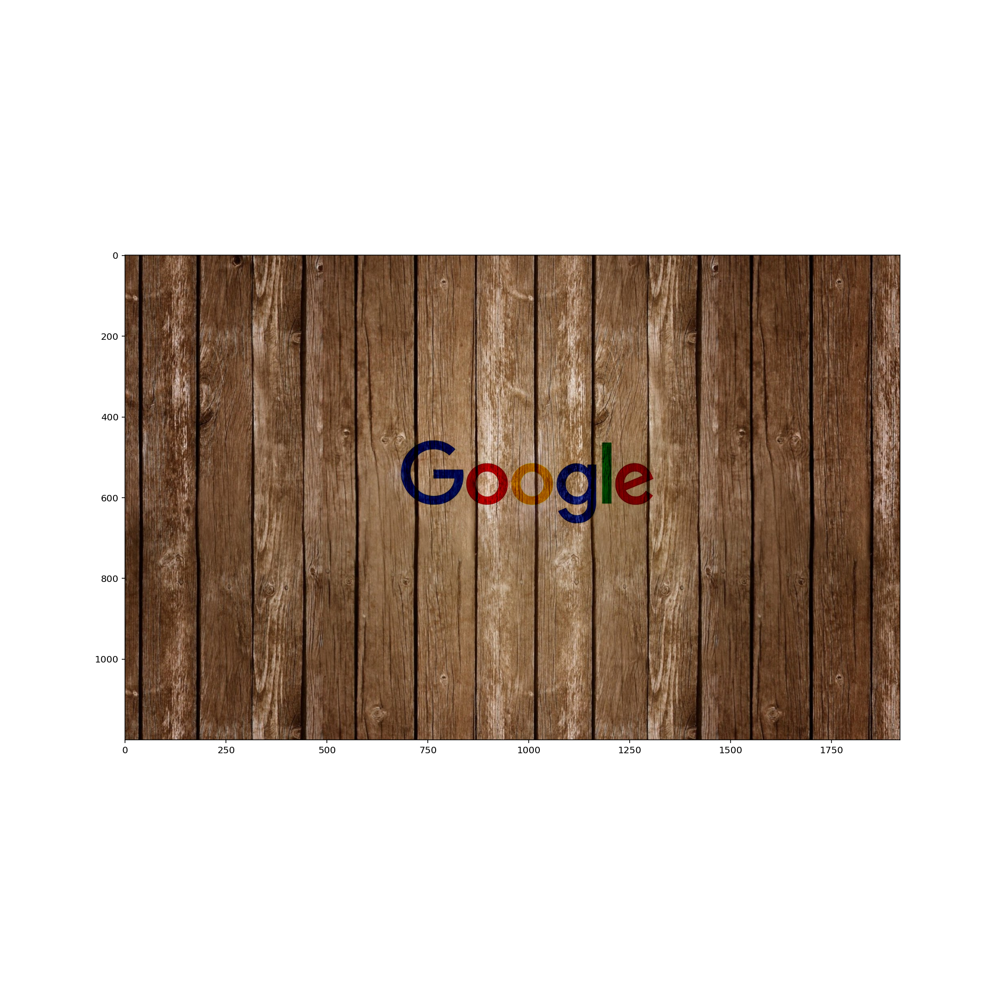

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


In [96]:
im_mix = np.zeros(background_img.shape)
for b in np.arange(3):
  im_mix[:,:,b] = mixed_blend(object_img[:,:,b], object_mask, background_img[:,:,b].copy(), bg_ul)

plt.figure(figsize=(15,15))
plt.imshow(im_mix)

# Bells & Whistles (Extra Points)

## Color2Gray (20 pts)

<IPython.core.display.Javascript object>


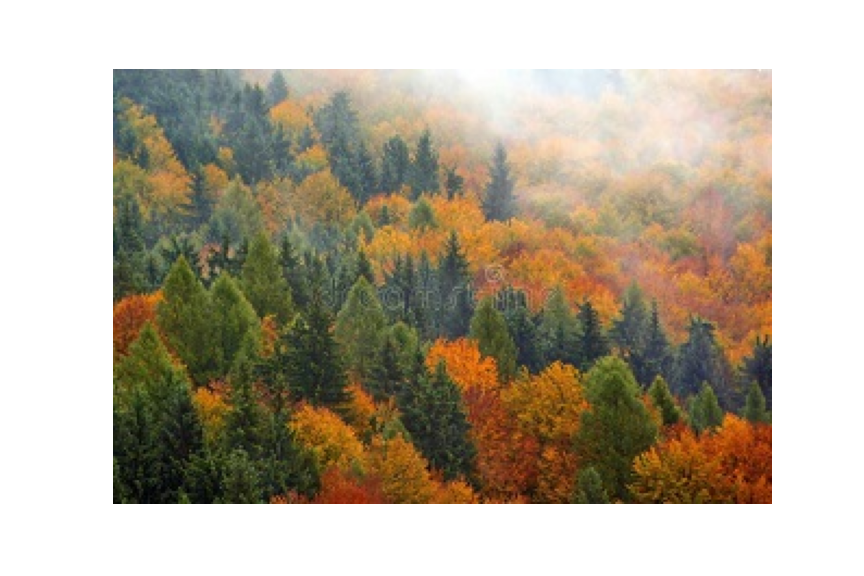

<IPython.core.display.Javascript object>


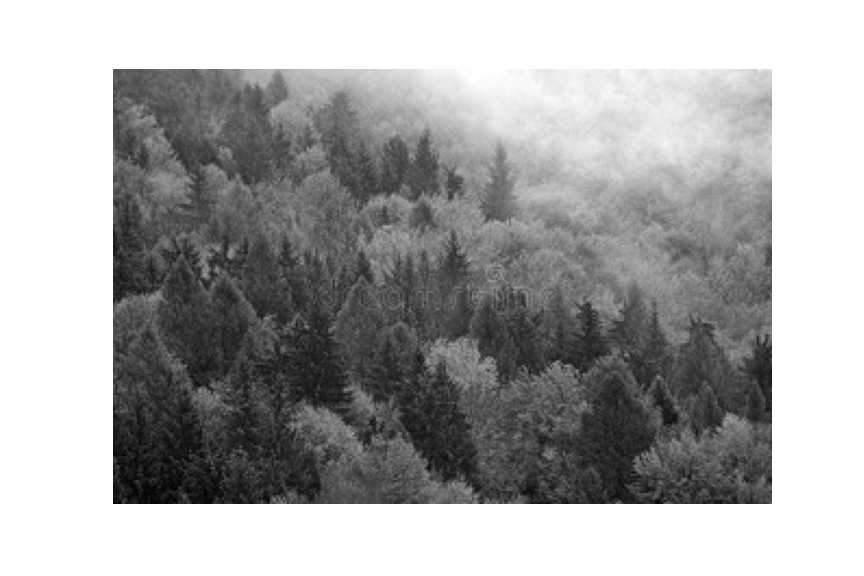

In [93]:
def grey_neighbors(y,x):
    near = []
    near.append((y, x+1))
    near.append((y+1, x))
    return near

def color2gray(img):
    curImg = img[:,:,0] # debug testing on 1 channel
    im_h, im_w = curImg.shape # get img shape
    im2var = np.arange(im_h * im_w).reshape(im_h, im_w)

    m = 2 * im_h * im_w
    n = im_h * im_w

    A = scipy.sparse.lil_matrix((m, n))
    b = np.zeros(m)

    e = 0

    for y in range(im_h-1):
        for x in range(im_w-1):
            for neighbor in grey_neighbors(y,x):
                A[e, im2var[y,x]] = 1 # set coefficient values
                A[e, im2var[neighbor]] = -1
                
                grad0 = img[y,x,0] - img[neighbor[0],neighbor[1],0]
                grad1 = img[y,x,1] - img[neighbor[0],neighbor[1],1]
                grad2 = img[y,x,2] - img[neighbor[0],neighbor[1],2]
                grads = np.array([grad0, grad1, grad2])
                
                maxGradIdx = np.argmax(np.abs(grads))
                
                maxGrad = grads[maxGradIdx]
                b[e] = maxGrad

                e += 1

    A = scipy.sparse.csr_matrix(A)
    v = scipy.sparse.linalg.lsqr(A, b)[0]
    return v.reshape(curImg.shape)


colorBlind = cv2.cvtColor(cv2.imread('samples/autumn.JPG'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
showImg(colorBlind)
showImg(color2gray(colorBlind))

## Laplacian pyramid blending (20 pts)

In [ ]:
def laplacian_blend(object_img, object_mask, bg_img, bg_ul):
  # feel free to change input parameters
    pass

## More gradient domain processing (up to 20 pts)